In [1]:
# !mkdir -p ~/aiffel/human_segmentation/models
# !mkdir -p ~/aiffel/human_segmentation/images

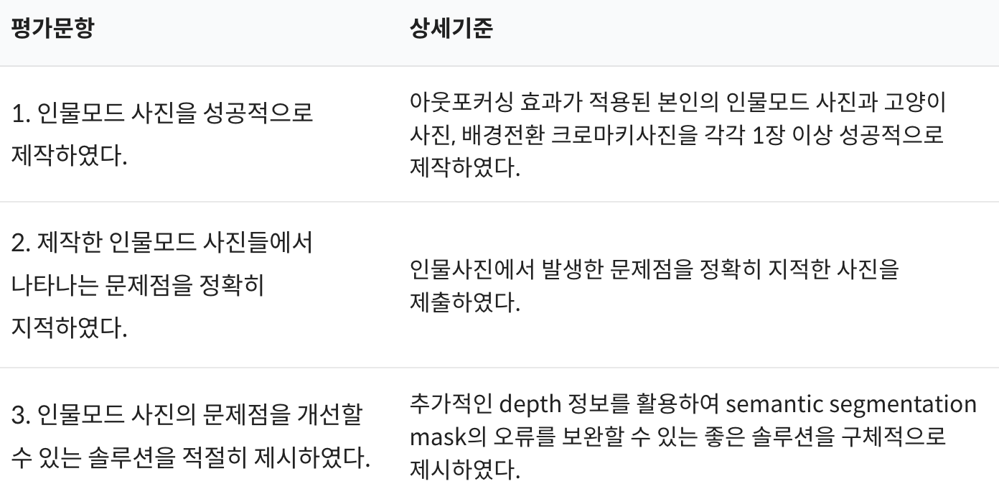

In [2]:
import os
import urllib
import cv2
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt

## 사람

### 데이터 세팅

(3024, 4032, 3)


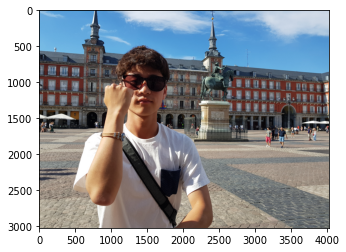

In [3]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/sample2.jpeg'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [4]:
# 저장할 파일 이름을 결정합니다
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models'
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

# PixelLib가 제공하는 모델의 url입니다
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'

# 다운로드를 시작합니다
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f10f48d51f0>)

In [5]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [6]:
segvalues, output = model.segmentAsPascalvoc(img_path)

In [7]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

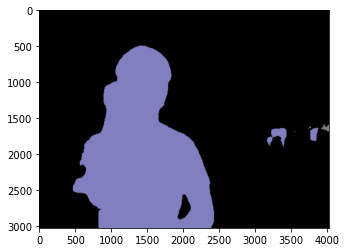

In [8]:
plt.imshow(output)
plt.show()

In [9]:
segvalues

{'class_ids': array([ 0,  7, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [10]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
car
person


In [11]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생상 코드 결과물이예요!
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [12]:
colormap[15]

array([192, 128, 128])

In [13]:
#추출해야하는 색상 값 순서 바꿔주기
seg_color = (128,128,192)

(3024, 4032)


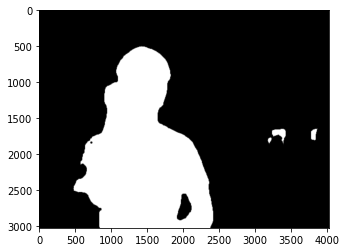

In [14]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='gray')
plt.show()

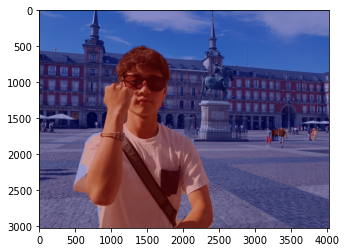

In [15]:
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

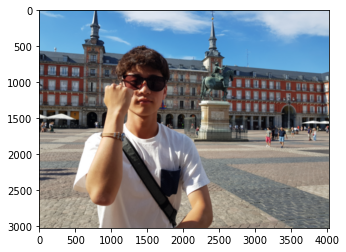

In [16]:
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (13,13))  
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

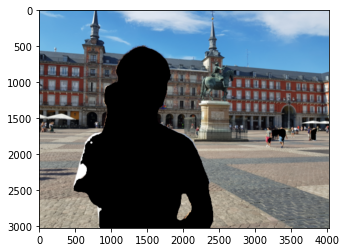

In [17]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

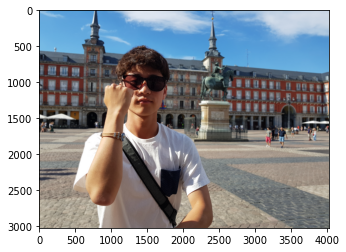

In [18]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

In [19]:
def blur_machine(img_path, obj, back = None):
    # data
    img_path = img_path 
    img_orig = cv2.imread(img_path) 

    # model
    model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models'
    model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')
    model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'
    urllib.request.urlretrieve(model_url, model_file)
    model = semantic_segmentation()
    model.load_pascalvoc_model(model_file)

    # 이미지 입력
    segvalues, output = model.segmentAsPascalvoc(img_path)


    LABEL_NAMES = [
        'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
        'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
        'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
    ]

    colormap = np.zeros((256, 3), dtype = int)
    ind = np.arange(256, dtype=int)

    for shift in reversed(range(8)):
        for channel in range(3):
            colormap[:, channel] |= ((ind >> channel) & 1) << shift
        ind >>= 3

    seg_color = tuple(colormap[LABEL_NAMES.index(obj)][::-1])

    # output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
    seg_map = np.all(output==seg_color, axis=-1)
    # True과 False인 값을 각각 255과 0으로 바꿔줍니다
    img_mask = seg_map.astype(np.uint8) * 255


    plt.figure(figsize=(16,10))
    plt.subplot(121)
    plt.title('원본')
    plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
    
    img_orig_blur = cv2.blur(img_orig, (40,40))     # 값이 커질 수록 blurr의 강도가 심해진다.
    plt.subplot(122)
    plt.title('전체 블러처리')
    plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
    plt.show()
    
    img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
    img_bg_mask = cv2.bitwise_not(img_mask_color)
    img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
    plt.figure(figsize=(16,10))
    plt.subplot(121)
    plt.title('객체 분리')
    plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))

    img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
    plt.subplot(122)
    plt.title('아웃포커싱')
    plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
    plt.show()
    
    # back이 있으면 
    if back:
        back_path = back
        img_back = cv2.imread(back_path) 
        img_resized = cv2.resize(img_orig, (img_back.shape[1], img_back.shape[0]))
        img_mask_resized = cv2.resize(img_mask_color, (img_back.shape[1], img_back.shape[0]))
        img_background_concat = np.where(img_mask_resized == 255, img_resized, img_back)
        plt.subplot(121)
        plt.title('배경 전환')
        plt.imshow(cv2.cvtColor(img_background_concat, cv2.COLOR_BGR2RGB))
        plt.show()

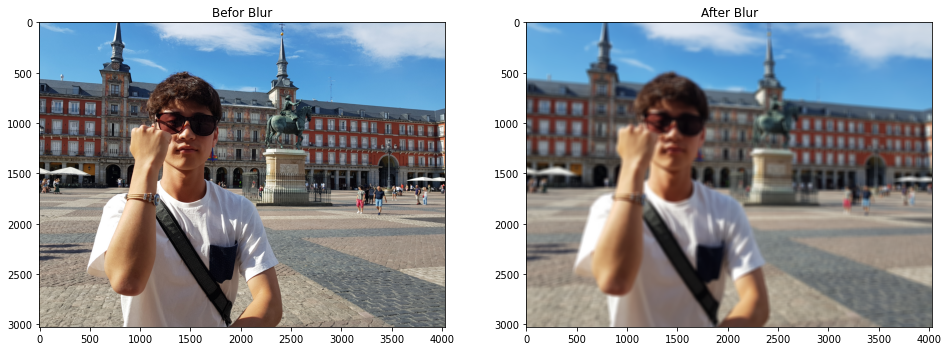

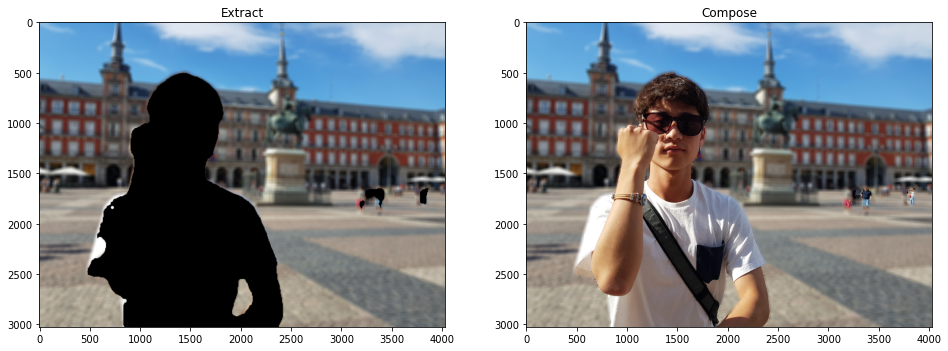

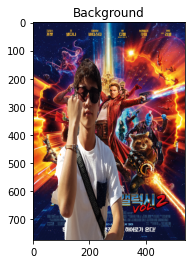

In [20]:
backpicture_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/guardianofgalaxy.jpeg'
blur_machine(img_path, 'person',backpicture_path)

In [21]:
backpicture_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/guardianofgalaxy.jpeg'
img_back = cv2.imread(backpicture_path)
img_back.shape

(774, 540, 3)

## 고양이

(201, 251, 3)


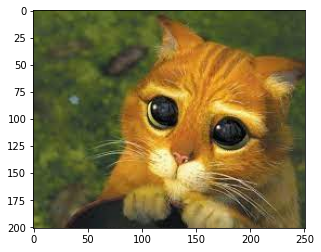

In [22]:
cat_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/cat.jpeg'  
cat_orig = cv2.imread(cat_path) 

print(cat_orig.shape)
plt.imshow(cv2.cvtColor(cat_orig, cv2.COLOR_BGR2RGB))
plt.show()

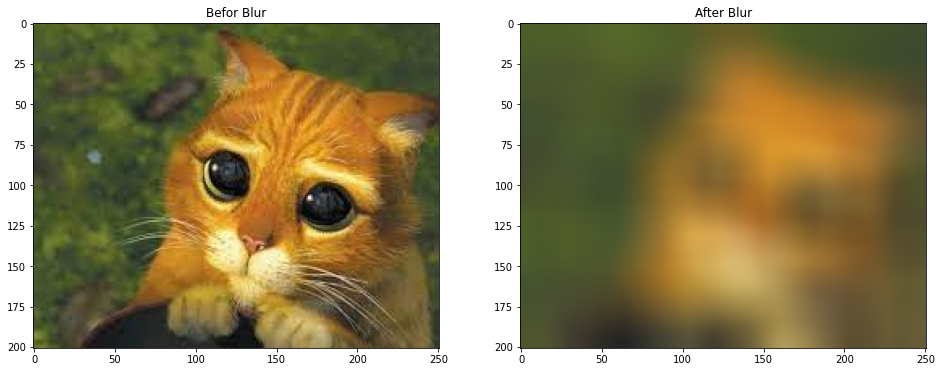

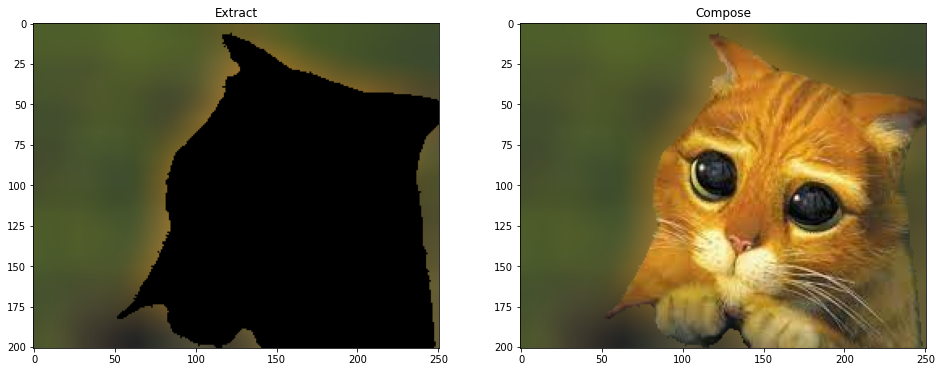

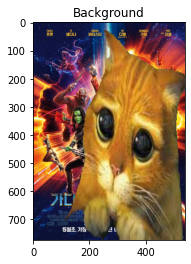

In [23]:
blur_machine(cat_path, 'cat',backpicture_path)

# 회고록

### 사진 출력하는 함수는 홍성현님의 코드를 참조하였습니다. (출처: https://github.com/seonghyun97/Aiffel_Exploration/blob/master/%5BE-10%5DPortrait.ipynb)

### Semantic Segmentation 결과 확인
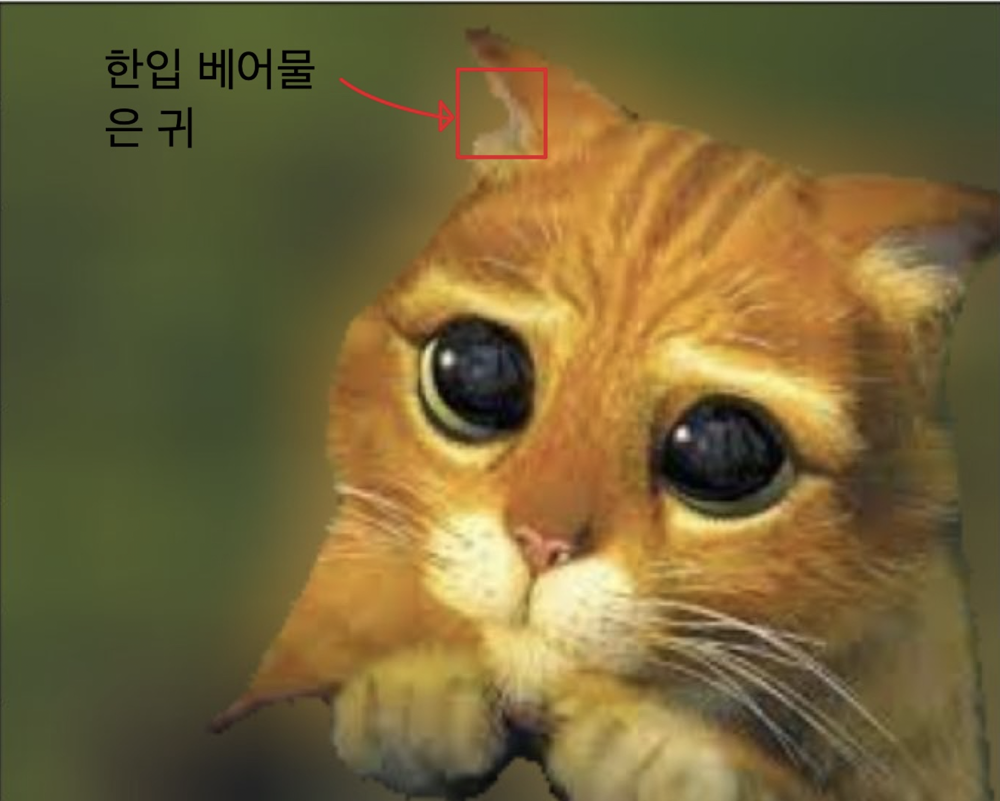
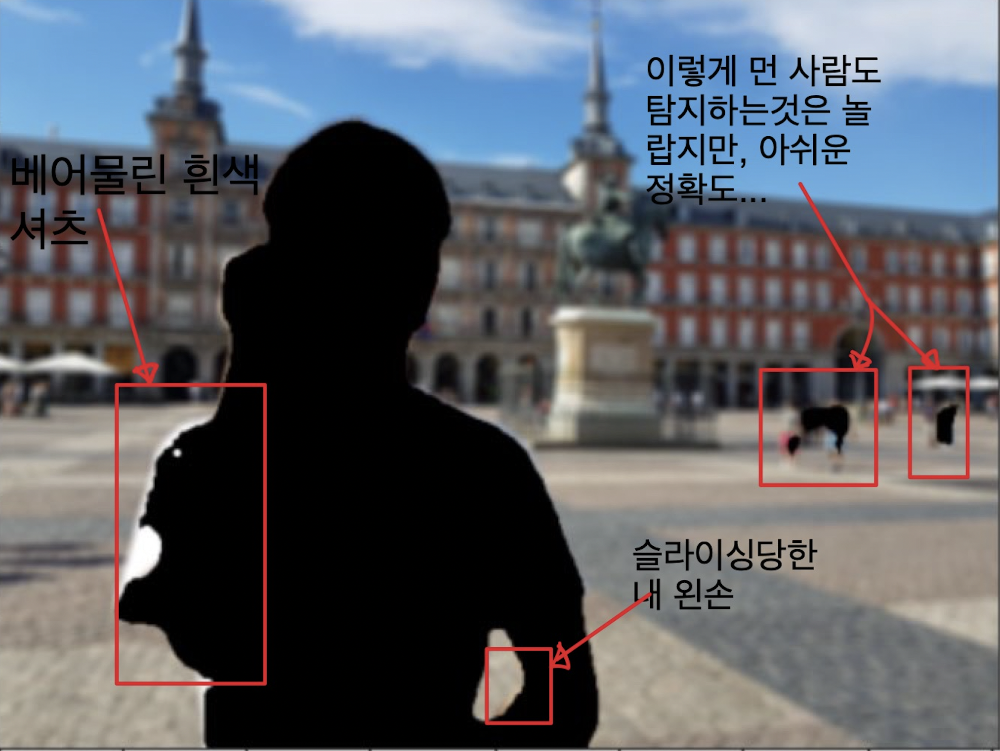

### 개선안
Instance Segmentation: 출처(http://dmqm.korea.ac.kr/activity/seminar/276)
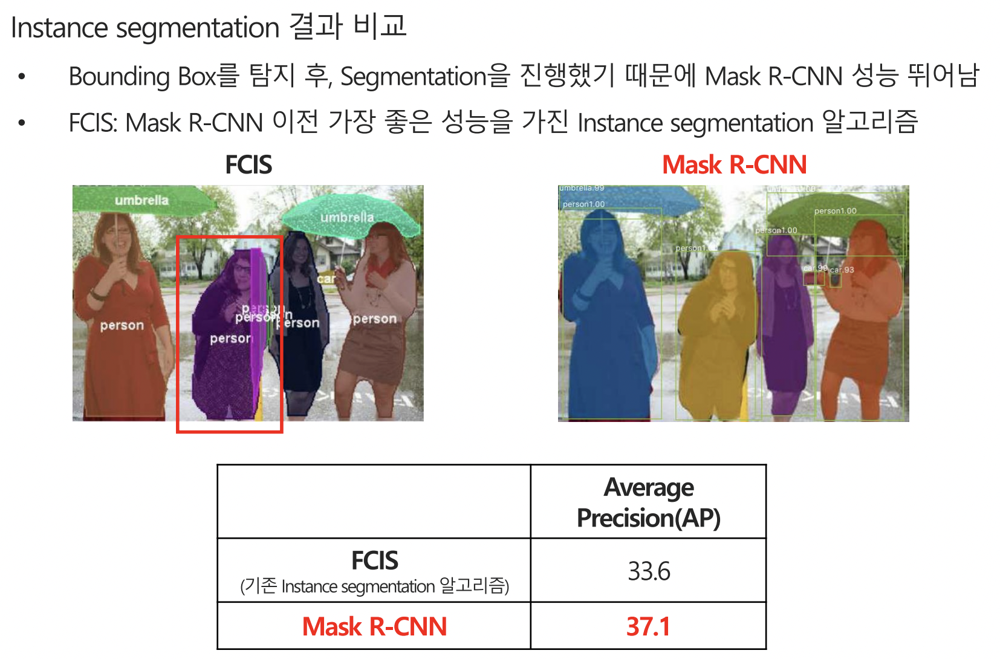
시멘틱은 객체 종류에따라 라벨값을 매기고 이를 픽셀에 적용하여 분류하는 작업으로 이루어져있는데, 동일한 라벨의 객체들이 모여있을 경우 몇개의 객체가 존재하는지 알 수 없다.(하나의 동일한 라벨을 가진 객체로 분류) 때문에 재현율이 다소 떨어지는 경향을 보인다고 말하고있다. Instance Segmetation의 경우 먼저 객체탐지로 각각의 객체들을 분리한후 세그멘테이션을 진행하기 때문에 동일한 라벨이라도 분리하여 다르게 분류한다. 이에따른 재현율 상승 효과를 보고있다고 PPT에서 설명하고있는데, 앞서 본 짤린부분도 box를 통해 객체로 선 분류 이후 세그멘테이션을 진행하면 좀더 나아지지 않을까 생각한다. 
    - 다만 여기서 말하는 Mask R-CNN이 Instance Segmentation을 의미하는지는 잘모르겠지만, Instance Segmetation의 효과를 Sementic과 가장 잘비교하는 보고서인 것 같아서 인용하였다.
    
### 추가
고양이 사진내에서 고양이가 차지하는 비율이 너무 높아서 크로마키할 때 배경의대부분이 가려져서 조금 아쉬웠다. 